In [1]:
!pip install -q kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d muhammadhananasghar/human-emotions-datasethes

 98% 302M/309M [00:02<00:00, 148MB/s]
100% 309M/309M [00:02<00:00, 135MB/s]


In [2]:
!unzip "/content/human-emotions-datasethes.zip" -d "/content/dataset/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/EmotionsDataset/data/nothing/720.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/721.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/722.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/723.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/724.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/725.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/726.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/727.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/728.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/729.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/73.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/730.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/731.jpg  
  inflating: /content/dataset/EmotionsDataset/data/no

In [38]:
train_directory = "/content/dataset/Emotions Dataset/Emotions Dataset/train"
validation_directory = "/content/dataset/Emotions Dataset/Emotions Dataset/test"


CONFIGURATION = {
    "BATCH_SIZE": 32,
    "IM_SIZE": 256,
    "LEARNING_RATE": 0.001,
    "N_EPOCHS": 100,
    "DROPOUT_RATE": 0.5,  # Increased dropout rate
    "REGULARIZATION_RATE": 0.001,  # Reduced regularization rate
    "N_FILTERS": 32,  # Increased number of filters
    "KERNEL_SIZE": 3,
    "N_STRIDES": 1,
    "POOL_SIZE": 2,
    "N_DENSE_1": 128,  # Increased number of neurons
    "N_DENSE_2": 64,  # Adjusted number of neurons
    "NUM_CLASSES": 3,
    "PATCH_SIZE": 16
}

In [39]:
import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory
train_dataset = image_dataset_from_directory(
    train_directory,labels='inferred',
    label_mode='categorical',
    class_names=CLASS_NAMES,
    color_mode='rgb',
    batch_size=CONFIGURATION["BATCH_SIZE"],
    image_size=(CONFIGURATION["IM_SIZE"],CONFIGURATION["IM_SIZE"]),
    shuffle=True,
    seed=99,
)

Found 6799 files belonging to 3 classes.


In [40]:
val_dataset = image_dataset_from_directory(
    validation_directory,labels='inferred',
    label_mode='categorical',
    class_names=CLASS_NAMES,
    color_mode='rgb',
    batch_size=CONFIGURATION["BATCH_SIZE"],
    image_size=(CONFIGURATION["IM_SIZE"],CONFIGURATION["IM_SIZE"]),
    shuffle=True,
    seed=99,
)

Found 2278 files belonging to 3 classes.


In [41]:
for i in val_dataset.take(1):
  print(i)

(<tf.Tensor: shape=(32, 256, 256, 3), dtype=float32, numpy=
array([[[[ 20.        ,  20.        ,  20.        ],
         [ 19.1875    ,  19.1875    ,  19.1875    ],
         [ 19.        ,  19.        ,  19.        ],
         ...,
         [ 29.125     ,  29.125     ,  29.125     ],
         [ 25.        ,  25.        ,  25.        ],
         [ 25.        ,  25.        ,  25.        ]],

        [[ 20.        ,  20.        ,  20.        ],
         [ 19.847656  ,  19.847656  ,  19.847656  ],
         [ 19.8125    ,  19.8125    ,  19.8125    ],
         ...,
         [ 28.820312  ,  28.820312  ,  28.820312  ],
         [ 25.660156  ,  25.660156  ,  25.660156  ],
         [ 25.        ,  25.        ,  25.        ]],

        [[ 20.6875    ,  20.6875    ,  20.6875    ],
         [ 21.246094  ,  21.246094  ,  21.246094  ],
         [ 21.847656  ,  21.847656  ,  21.847656  ],
         ...,
         [ 25.3125    ,  25.3125    ,  25.3125    ],
         [ 22.375     ,  22.375     ,  22.375 

In [42]:
import matplotlib.pyplot as plt

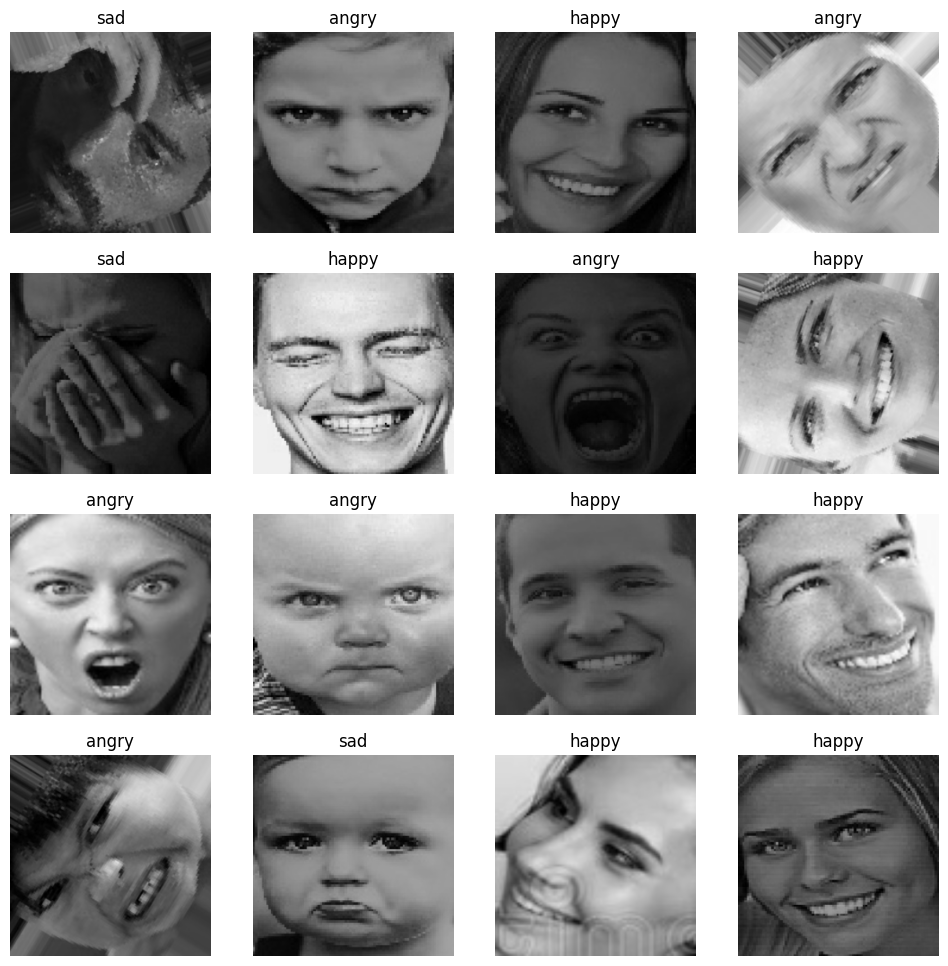

In [43]:
plt.figure(figsize=(12,12))
for images,labels in train_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4,4,i+1)
    plt.imshow(images[i]/255.)
    plt.title(CLASS_NAMES[tf.argmax(labels[i],axis=0).numpy()])
    plt.axis('off')

In [44]:
from tensorflow.keras.layers import RandomFlip,RandomRotation,RandomContrast,Rescaling,Resizing
augment_layers = tf.keras.Sequential([
    RandomRotation(factor=(-0.025,0.025),),
    RandomFlip(mode='horizontal',),
    RandomContrast(factor=0.1),

    ])

In [45]:
def augment_layer(image,label):
  return augment_layers(image,training=True),label

In [46]:
from tensorflow.keras.layers import Rescaling
from tensorflow.keras.layers.experimental.preprocessing import Resizing
resize_rescale_layers = tf.keras.Sequential([
    Resizing(CONFIGURATION["IM_SIZE"],CONFIGURATION["IM_SIZE"]),
    Rescaling(1./255),
])

In [47]:
from tensorflow.keras.layers import InputLayer,Conv2D,Dropout,MaxPool2D,BatchNormalization,Flatten,Dense
from tensorflow.keras.regularizers import L2

In [48]:
from tensorflow.keras.layers import InputLayer, Conv2D, BatchNormalization, MaxPool2D, Dropout, Flatten, Dense,RandomFlip,RandomRotation,Rescaling,Resizing
from tensorflow.keras.regularizers import L2
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

lenet_model = tf.keras.Sequential([
    InputLayer(input_shape=(None, None, 3)),
    resize_rescale_layers ,
    Conv2D(filters=CONFIGURATION["N_FILTERS"], kernel_size=CONFIGURATION["KERNEL_SIZE"],
           strides=CONFIGURATION["N_STRIDES"], activation='relu',
           kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    MaxPool2D(pool_size=CONFIGURATION["POOL_SIZE"], strides=CONFIGURATION["N_STRIDES"] * 2),
    Dropout(rate=CONFIGURATION["DROPOUT_RATE"]),

    Conv2D(filters=CONFIGURATION["N_FILTERS"] * 2 + 4, kernel_size=CONFIGURATION["KERNEL_SIZE"],
           strides=CONFIGURATION["N_STRIDES"], activation='relu',
           kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    MaxPool2D(pool_size=CONFIGURATION["POOL_SIZE"], strides=CONFIGURATION["N_STRIDES"] * 2),

    Flatten(),

    Dense(CONFIGURATION["N_DENSE_1"], activation="relu",
          kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    Dropout(rate=CONFIGURATION["DROPOUT_RATE"]),

    Dense(CONFIGURATION["N_DENSE_2"], activation='relu',
          kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),

    Dense(CONFIGURATION["NUM_CLASSES"], activation='softmax')
])

lenet_model.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_4 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 batch_normalization_4 (Bat  (None, 254, 254, 32)      128       
 chNormalization)                                                
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 127, 127, 32)      0         
                                                                 
 conv2d_3 (Conv2D)           (None, 125, 125, 68)     

In [49]:
METRIC_DIR='./logs/metrics'
train_writer=tf.summary.create_file_writer(METRIC_DIR)

In [50]:

from tensorflow.keras.metrics import CategoricalAccuracy, TopKCategoricalAccuracy
metrics = [
    CategoricalAccuracy(name="accuracy"),
    TopKCategoricalAccuracy(k=2, name="top_k_accuracy")
]

In [51]:
from tensorflow.keras.metrics import CategoricalAccuracy,TopKCategoricalAccuracy,TruePositives,FalsePositives,TrueNegatives,FalseNegatives,Precision,Recall,AUC
from tensorflow.keras.losses import CategoricalCrossentropy
loss_function = CategoricalCrossentropy()
metrics = [CategoricalAccuracy(name="accuracy"),TopKCategoricalAccuracy(k=2,name="top_k_accuracy"),TruePositives(name='tp'),FalsePositives(name='fp'),TrueNegatives(name='tn'),FalseNegatives(name='fn'),
           Precision(name='precision'),Recall(name='recall'),AUC(name='auc')]

In [52]:
from tensorflow.keras.callbacks import EarlyStopping,LearningRateScheduler,ModelCheckpoint
es_callback=EarlyStopping(
    monitor='val_loss',min_delta=0,patience=10,verbose=1,
    mode='auto',baseline=None,restore_best_weights=False
)

def scheduler(epoch,lr):
  if epoch<=3:
    learning_rate= lr
  else:
    learning_rate= lr*tf.math.exp(-0.1)
  with train_writer.as_default():
    tf.summary.scalar('learning rate',data=learning_rate,step=epoch)
  return learning_rate
schedular_callback=LearningRateScheduler(scheduler,verbose=1)

checkpoint_callback=ModelCheckpoint(
    'weights.{epoch:02d}--{val_loss:.2f}.hdf5',monitor='val_precision',verbose=0,save_best_only=True,
    save_weights_only=True,mode='auto',save_freq='epoch'
)


In [53]:
from tensorflow.keras.optimizers import Adam
lenet_model.compile(
    optimizer=Adam(learning_rate=CONFIGURATION['LEARNING_RATE']),
    loss = loss_function,
    metrics=metrics
)

In [54]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")
history = lenet_model.fit(
    train_dataset,validation_data=val_dataset,
    epochs=CONFIGURATION['N_EPOCHS'],
    verbose=1,
    callbacks=[tensorboard_callback,schedular_callback,es_callback,checkpoint_callback]
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/100
213/213 [==============================] - 55s 226ms/step - loss: 2.3935 - accuracy: 0.4533 - top_k_accuracy: 0.7594 - tp: 2176.0000 - fp: 2336.0000 - tn: 11262.0000 - fn: 4623.0000 - precision: 0.4823 - recall: 0.3200 - auc: 0.6246 - val_loss: 3.5114 - val_accuracy: 0.4416 - val_top_k_accuracy: 0.7463 - val_tp: 1006.0000 - val_fp: 1272.0000 - val_tn: 3284.0000 - val_fn: 1272.0000 - val_precision: 0.4416 - val_recall: 0.4416 - val_auc: 0.6061 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/100
213/213 [==============================] - 40s 188ms/step - loss: 1.9543 - accuracy: 0.5085 - top_k_accuracy: 0.7936 - tp: 2383.0000 - fp: 1868.0000 - tn: 11730.0000 - fn: 4416.0000 - precision: 0.5606 - recall: 0.3505 - auc: 0.6816 - val_loss: 2.9473 - val_accuracy: 0.3512 - val_top_k_accuracy: 0.6392 - val_tp: 756.0000 - val_fp: 1334.0000 - val_tn: 322

In [55]:
lenet_model.save('./lenet_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [56]:
%load_ext tensorboard

In [57]:
tensorboard --logdir="/content/logs"

Reusing TensorBoard on port 6006 (pid 5448), started 1:11:19 ago. (Use '!kill 5448' to kill it.)

<IPython.core.display.Javascript object>

In [58]:
predicted = []
labels = []

for im,label in val_dataset:
  predicted.append(lenet_model(im))
  labels.append(label.numpy())
import numpy as np
print(np.concatenate([np.argmax(labels[:-1], axis=-1).flatten(), np.argmax(labels[-1], axis=-1).flatten()]))
print(np.concatenate([np.argmax(predicted[:-1], axis=-1).flatten(), np.argmax(predicted[-1], axis=-1).flatten()]))
true =np.concatenate([np.argmax(labels[:-1], axis=-1).flatten(), np.argmax(labels[-1], axis=-1).flatten()])
pred =np.concatenate([np.argmax(predicted[:-1], axis=-1).flatten(), np.argmax(predicted[-1], axis=-1).flatten()])



[0 2 1 ... 2 2 1]
[1 2 1 ... 2 2 1]


[[326 107  82]
 [ 35 881  90]
 [ 63 152 542]]


Text(70.72222222222221, 0.5, 'actual')

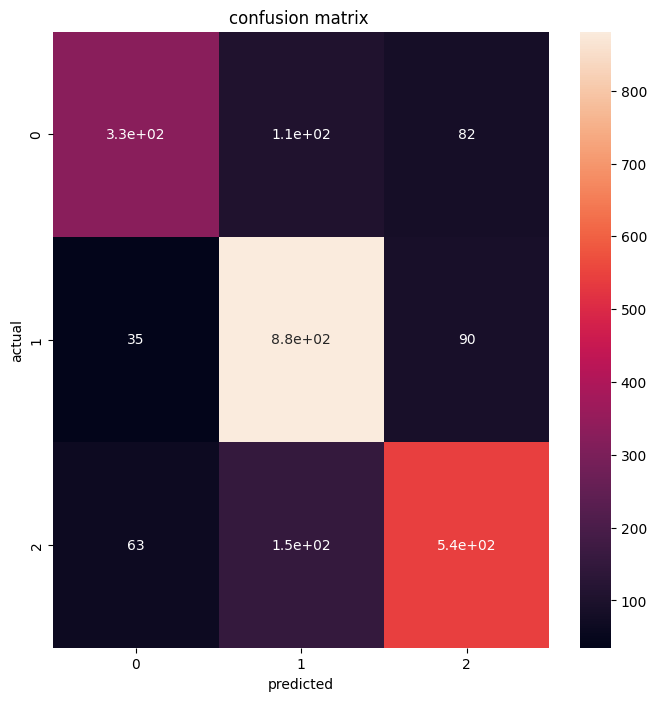

In [59]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(true,pred)
print(cm)
plt.figure(figsize=(8,8))
sns.heatmap(cm,annot=True)
plt.title("confusion matrix ")
plt.xlabel('predicted')
plt.ylabel('actual')

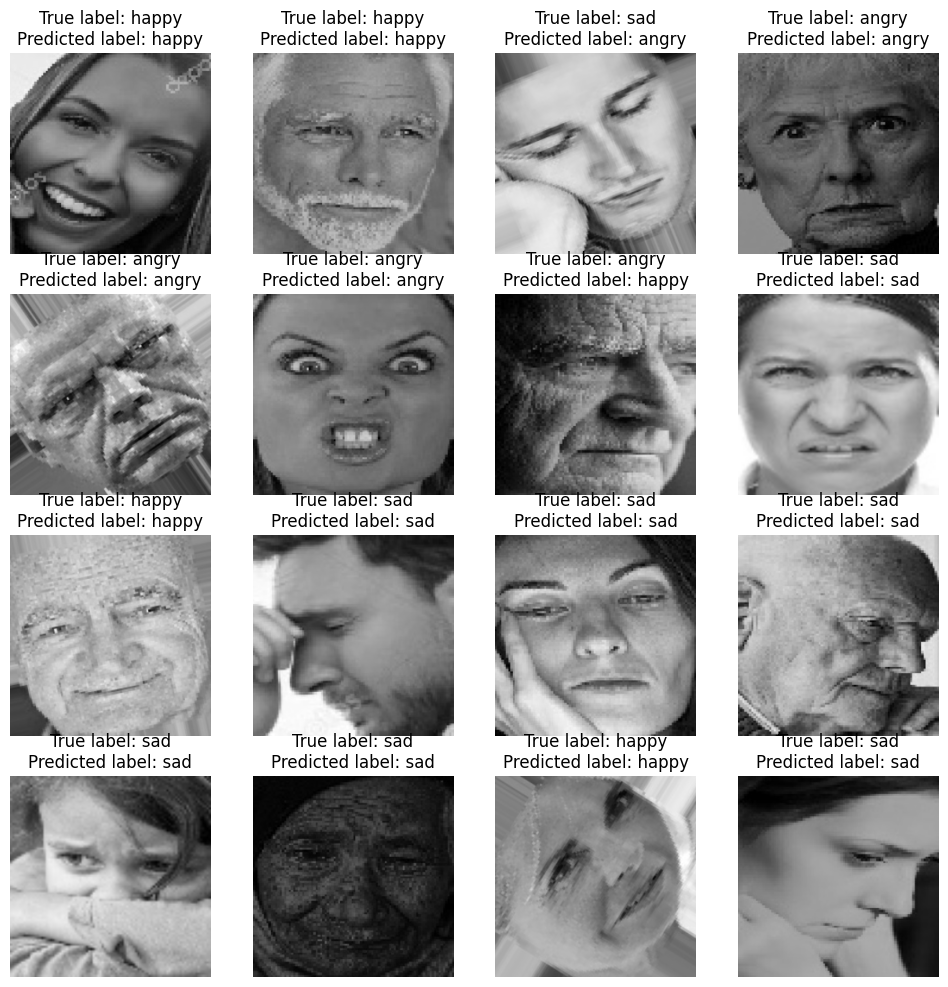

In [60]:
plt.figure(figsize=(12,12))
for images, labels in val_dataset.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i+1)
        plt.imshow(images[i] / 255.)
        true_label = CLASS_NAMES[tf.argmax(labels[i], axis=0).numpy()]
        predicted_label = CLASS_NAMES[tf.argmax(lenet_model(tf.expand_dims(images[i], axis=0)).numpy()[0])]
        plt.title("True label: " + true_label + "\n" + "Predicted label: " + predicted_label)
        plt.axis('off')


In [61]:
# using vggnet model
import tensorflow as tf
vgg_backbone= tf.keras.applications.vgg16.VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(CONFIGURATION['IM_SIZE'],CONFIGURATION['IM_SIZE'],3),

)


def is_conv(layer_name):
  if 'conv' in layer_name:
    return True
  else:
    return False


from tensorflow.keras.models import Model

feature_maps = [layer.output for layer in vgg_backbone.layers[1:] if is_conv(layer.name)]
feature_map_model = Model(
    inputs = vgg_backbone.input,
    outputs = feature_maps
)
feature_map_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0   

In [62]:
import cv2
test_image=cv2.imread("/content/dataset/Emotions Dataset/Emotions Dataset/test/angry/101071.jpg_rotation_1.jpg")
test_image = cv2.resize(test_image,(CONFIGURATION["IM_SIZE"],CONFIGURATION["IM_SIZE"]))
im = tf.constant(test_image,dtype=tf.float32)
im = tf.expand_dims(im,axis=0)
f_maps = feature_map_model.predict(im)

1/1 [==============================] - 0s 192ms/step


In [63]:
print(len(f_maps))

13


In [64]:
for i in range(len(f_maps)):
  print(f_maps[i].shape)


(1, 256, 256, 64)
(1, 256, 256, 64)
(1, 128, 128, 128)
(1, 128, 128, 128)
(1, 64, 64, 256)
(1, 64, 64, 256)
(1, 64, 64, 256)
(1, 32, 32, 512)
(1, 32, 32, 512)
(1, 32, 32, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)


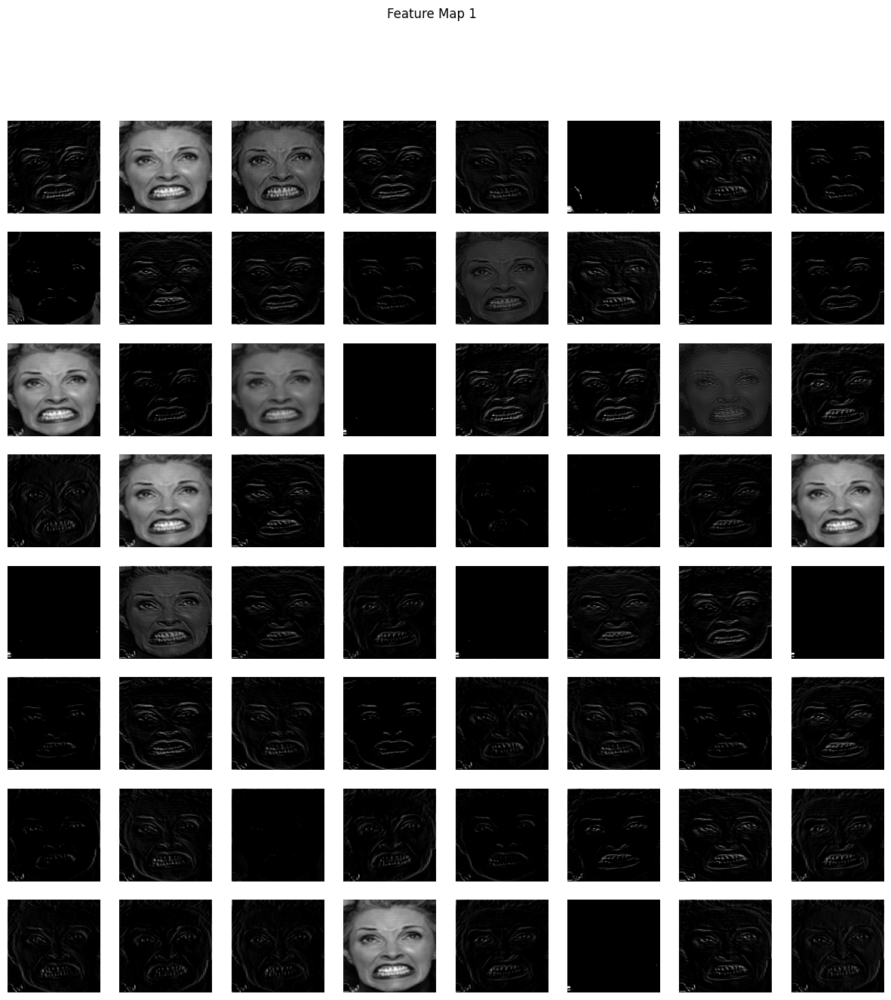

<Figure size 640x480 with 0 Axes>

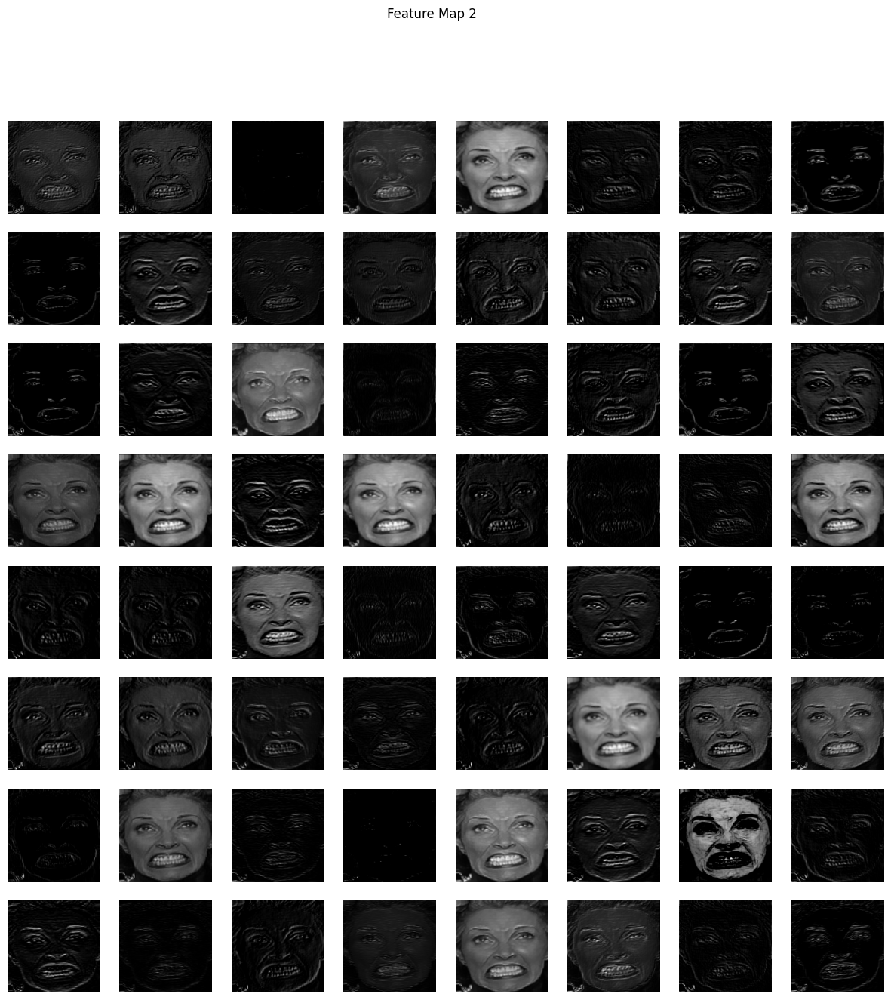

<Figure size 640x480 with 0 Axes>

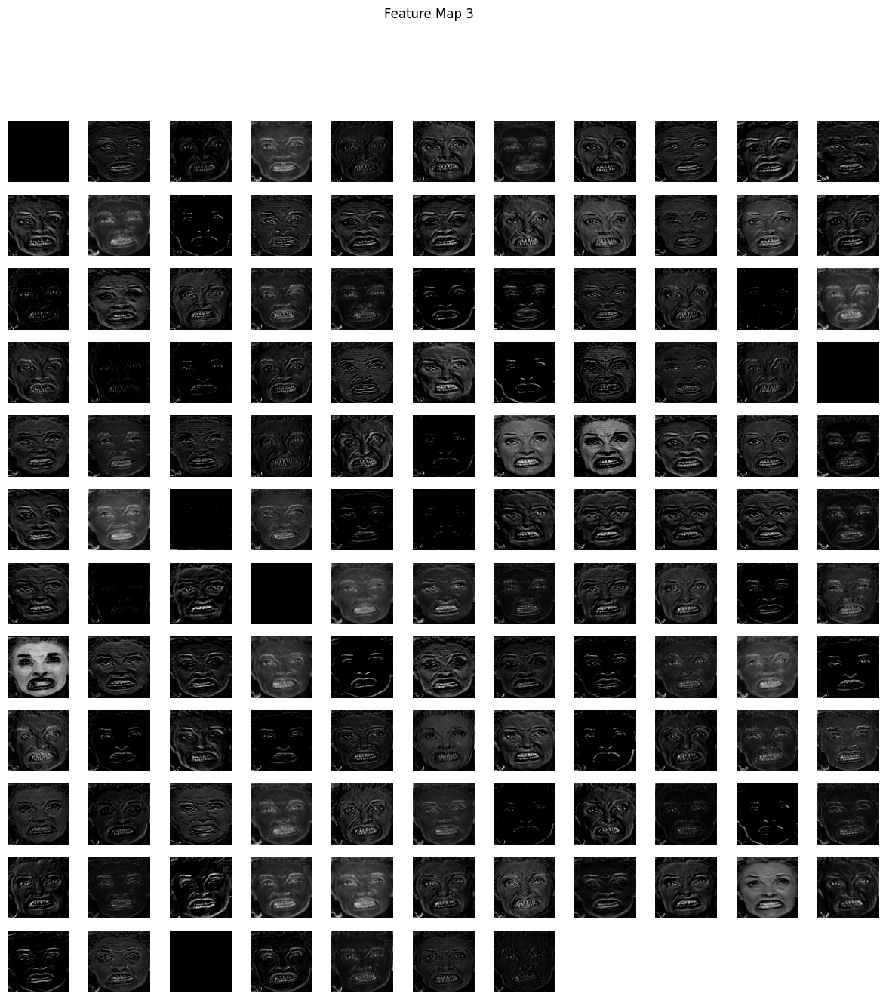

<Figure size 640x480 with 0 Axes>

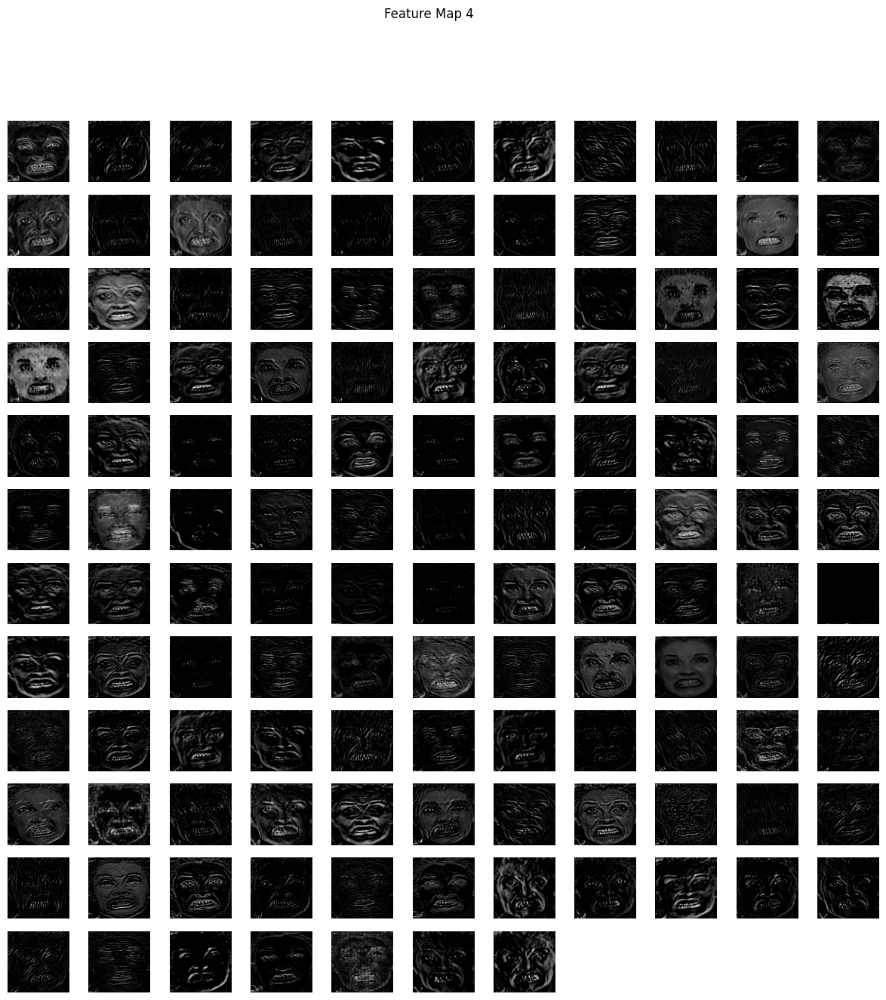

<Figure size 640x480 with 0 Axes>

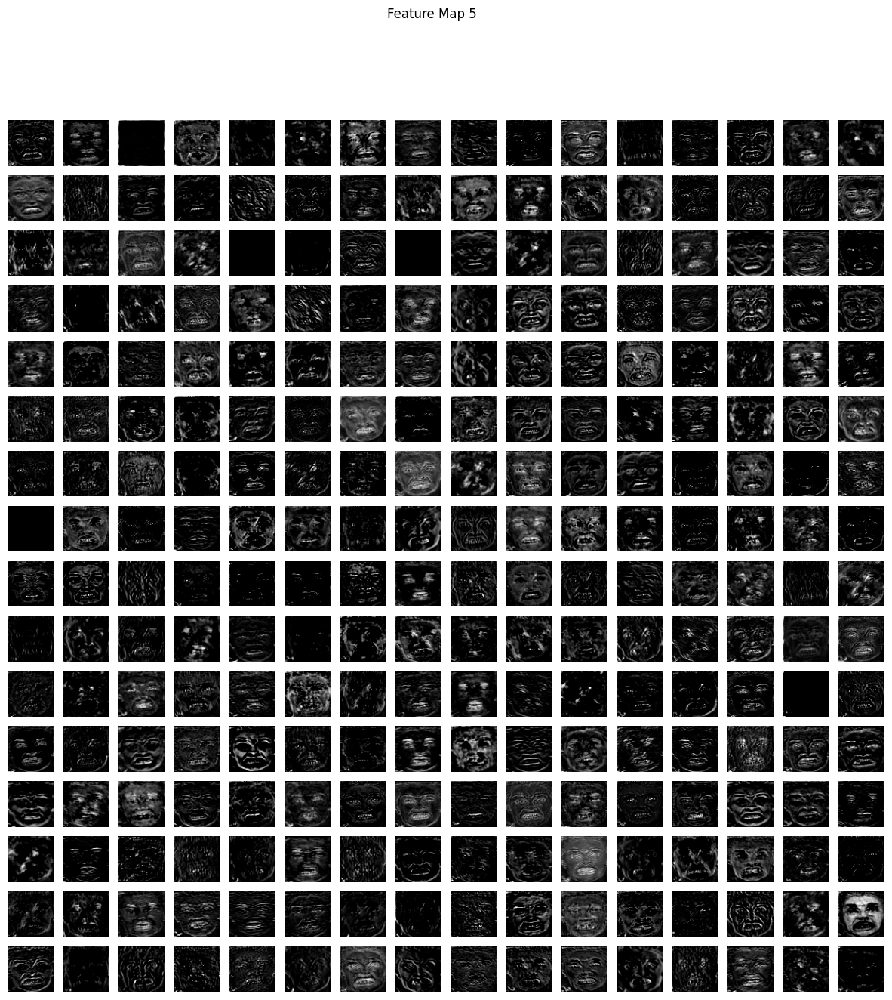

<Figure size 640x480 with 0 Axes>

In [65]:
import matplotlib.pyplot as plt
import numpy as np
num_f_maps = min(len(f_maps), 5)

for i in range(num_f_maps):
    f_size = f_maps[i].shape[1]
    n_channels = f_maps[i].shape[3]
    joint_maps = np.ones((f_size, f_size * n_channels))

    for j in range(n_channels):
        channel_image = np.squeeze(f_maps[i][..., j])
        joint_maps[:, f_size*j:f_size*(j+1)] = channel_image
    subplot_size = np.sqrt(n_channels)
    subplot_rows = int(np.ceil(subplot_size))
    subplot_cols = int(np.ceil(n_channels / subplot_rows))

    plt.figure(figsize=(15, 15))
    plt.subplots_adjust(wspace=0.2, hspace=0.2)

    for j in range(n_channels):
        plt.subplot(subplot_rows, subplot_cols, j + 1)
        plt.imshow(np.squeeze(f_maps[i][..., j]), cmap='gray')
        plt.axis('off')

    plt.suptitle(f"Feature Map {i+1}")
    plt.show()
    plt.clf()


In [80]:
import cv2
test_image = cv2.imread("/content/dataset/Emotions Dataset/Emotions Dataset/train/happy/100711.jpg")
test_image = cv2.resize(test_image,(CONFIGURATION['IM_SIZE'],CONFIGURATION['IM_SIZE']))

In [81]:
patches = tf.image.extract_patches(images=tf.expand_dims(test_image,axis=0),
                           sizes=[1,CONFIGURATION['PATCH_SIZE'],CONFIGURATION['PATCH_SIZE'],1],
                           strides=[1,CONFIGURATION['PATCH_SIZE'],CONFIGURATION['PATCH_SIZE'],1],
                           rates=[1,1,1,1],
                           padding='VALID')

In [82]:
print(patches.shape)

(1, 16, 16, 768)


InvalidArgumentError: {{function_node __wrapped__Reshape_device_/job:localhost/replica:0/task:0/device:GPU:0}} Input to reshape is a tensor with 12288 values, but the requested shape has 768 [Op:Reshape]

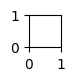

In [83]:
plt.figure(figsize=(8,8))
for i in range(patches.shape[1]):
    ax = plt.subplot(16,16,i+1)
    plt.imshow(tf.reshape(patches[0,i,:],(16,16,3)))
    plt.axis('off')

In [84]:
import tensorflow as tf
from tensorflow.keras.layers import Layer,Dense,Embedding,LayerNormalization,MultiHeadAttention,Add,Flatten
from tensorflow.keras.models import Model

In [85]:
class PatchEncoder(Layer):
    def __init__(self, N_PATCHES, HIDDEN_SIZE):
        super(PatchEncoder, self).__init__(name='patch_encoder')

        self.linear_projection = Dense(HIDDEN_SIZE)
        self.positional_embedding = Embedding(N_PATCHES, HIDDEN_SIZE)
        self.N_PATCHES = N_PATCHES

    def call(self, x):
        patches = tf.image.extract_patches(
            images=x,
            sizes=[1, CONFIGURATION['PATCH_SIZE'], CONFIGURATION['PATCH_SIZE'], 1],
            strides=[1, CONFIGURATION['PATCH_SIZE'], CONFIGURATION['PATCH_SIZE'], 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        patches = tf.reshape(patches, (tf.shape(patches)[0], -1, patches.shape[-1]))
        embedding_input = tf.range(start=0, limit=self.N_PATCHES, delta=1)
        output = self.linear_projection(patches) + self.positional_embedding(embedding_input)
        return output


In [86]:

patchenc = PatchEncoder(256,768)
patchenc(tf.zeros([1,256,256,3]))

<tf.Tensor: shape=(1, 256, 768), dtype=float32, numpy=
array([[[-0.00828267,  0.04062561, -0.02086622, ...,  0.00555872,
          0.01339778,  0.01671726],
        [-0.01940353, -0.02246633, -0.03375586, ...,  0.03503097,
          0.02535262, -0.01722397],
        [-0.04655608, -0.00023546,  0.03740689, ...,  0.02348511,
          0.01845516,  0.01726382],
        ...,
        [ 0.03489104, -0.03149508,  0.00852177, ...,  0.03882692,
          0.01224384, -0.0131887 ],
        [-0.0205767 , -0.0144924 , -0.03883289, ...,  0.04450283,
          0.0286804 ,  0.04065016],
        [ 0.03632733,  0.01436922,  0.04357601, ...,  0.04009198,
          0.0365965 , -0.00563185]]], dtype=float32)>

In [87]:
class TransformerEncoder(Layer):
    def __init__(self, N_HEADS, HIDDEN_SIZE):
        super(TransformerEncoder, self).__init__(name='transformer_encoder')
        self.layer_norm_1 = LayerNormalization()
        self.layer_norm_2 = LayerNormalization()
        self.multi_head_att = MultiHeadAttention(N_HEADS,HIDDEN_SIZE)
        self.dense_1 = Dense(HIDDEN_SIZE,activation=tf.nn.gelu)
        self.dense_2 = Dense(HIDDEN_SIZE,activation=tf.nn.gelu)

    def call(self, input):
        x_1 = self.layer_norm_1(input)
        x_1 = self.multi_head_att(x_1,x_1)
        x_1  = Add()([x_1,input])

        x_2 = self.layer_norm_2(x_1)
        x_2 = self.dense_1(x_2)
        output = self.dense_2(x_2)
        output = Add()([output,x_1])
        return output


In [88]:
transenc = TransformerEncoder(N_HEADS=8,HIDDEN_SIZE=768)
transenc(tf.zeros([1,256,768]))

<tf.Tensor: shape=(1, 256, 768), dtype=float32, numpy=
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)>

In [89]:
class ViT(Model):
  def __init__(self,N_HEADS,HIDDEN_SIZE,N_PATCHES,N_LAYERS,N_DENSE_UNITS):
        super(ViT, self).__init__(name='vision_transformer')
        self.N_LAYERS = N_LAYERS
        self.patch_encoder = PatchEncoder(N_PATCHES,HIDDEN_SIZE)
        self.trans_encoders = [TransformerEncoder(N_HEADS,HIDDEN_SIZE) for _ in range(N_LAYERS)]
        self.dense_1 = Dense(N_DENSE_UNITS,tf.nn.gelu)
        self.dense_2 = Dense(N_DENSE_UNITS,tf.nn.gelu)
        self.dense_3 = Dense(CONFIGURATION['NUM_CLASSES'],activation='softmax')

  def call(self,x,training=True):
    x = self.patch_encoder(x)
    for i in range(self.N_LAYERS):
      x = self.trans_encoders[i](x)
    x = Flatten()(x)
    x = self.dense_1(x)
    x = self.dense_2(x)
    return self.dense_3(x)

In [90]:
vit = ViT(N_HEADS=4,HIDDEN_SIZE=768,N_PATCHES=256,N_LAYERS=2,N_DENSE_UNITS=128)
vit(tf.zeros([32,256,256,3]))

<tf.Tensor: shape=(32, 3), dtype=float32, numpy=
array([[0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
       [0.5553332 , 0.26591003, 0.17875674],
      

In [91]:
vit.summary()

Model: "vision_transformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 patch_encoder (PatchEncode  multiple                  787200    
 r)                                                              
                                                                 
 transformer_encoder (Trans  multiple                  10631424  
 formerEncoder)                                                  
                                                                 
 transformer_encoder (Trans  multiple                  10631424  
 formerEncoder)                                                  
                                                                 
 dense_25 (Dense)            multiple                  25165952  
                                                                 
 dense_26 (Dense)            multiple                  16512     
                                                

In [92]:
from tensorflow.keras.metrics import categorical_accuracy
import tensorflow as tf

metrics = [
    tf.keras.metrics.CategoricalAccuracy(name="accuracy"),
    tf.keras.metrics.TopKCategoricalAccuracy(k=2, name="top_k_accuracy")
]



In [93]:
from tensorflow.keras.optimizers import Adam
vit.compile(
    optimizer=Adam(learning_rate=CONFIGURATION['LEARNING_RATE']),
    loss = 'categorical_crossentropy',
    metrics=metrics)


In [96]:
history = vit.fit(
    train_dataset,
    validation_data = val_dataset,
    epochs=5,
    verbose=1,
)

Epoch 1/5
213/213 [==============================] - 98s 460ms/step - loss: 70.7367 - accuracy: 0.4608 - top_k_accuracy: 0.8653 - val_loss: 20.1536 - val_accuracy: 0.4956 - val_top_k_accuracy: 0.7946
Epoch 2/5
213/213 [==============================] - 98s 461ms/step - loss: 9.3956 - accuracy: 0.5855 - top_k_accuracy: 0.8550 - val_loss: 7.6625 - val_accuracy: 0.5663 - val_top_k_accuracy: 0.8367
Epoch 3/5
213/213 [==============================] - 99s 462ms/step - loss: 5.7805 - accuracy: 0.6224 - top_k_accuracy: 0.8659 - val_loss: 5.1429 - val_accuracy: 0.5808 - val_top_k_accuracy: 0.8297
Epoch 4/5
213/213 [==============================] - 108s 507ms/step - loss: 16.6424 - accuracy: 0.6316 - top_k_accuracy: 0.8788 - val_loss: 546.5573 - val_accuracy: 0.3319 - val_top_k_accuracy: 0.9960
Epoch 5/5
213/213 [==============================] - 91s 428ms/step - loss: 5554.3921 - accuracy: 0.3895 - top_k_accuracy: 0.8163 - val_loss: 1.2282 - val_accuracy: 0.4416 - val_top_k_accuracy: 0.7739
